                   Colunas                                                                             Valores
0         Nome das classes  Carregador, Sapo, Pente, Luva, Remedio, Borracha, Desodorante, Tesoura, T, Coracao
1        Número de classes                                                                                  10
2        Número de imagens                                                                                  24
3  Tamanho da base (bytes)                                                                               16384
4    Resolução das imagens                                                                         (720, 1600)


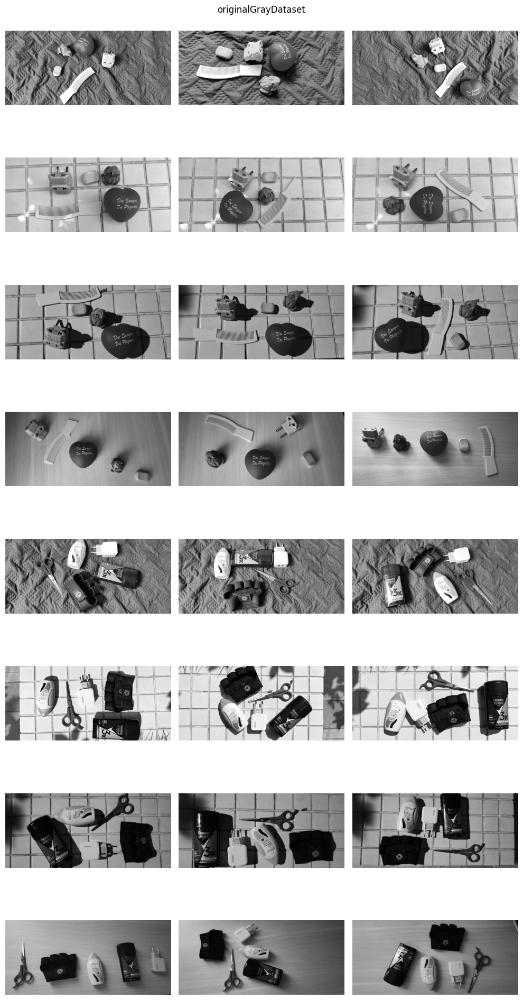

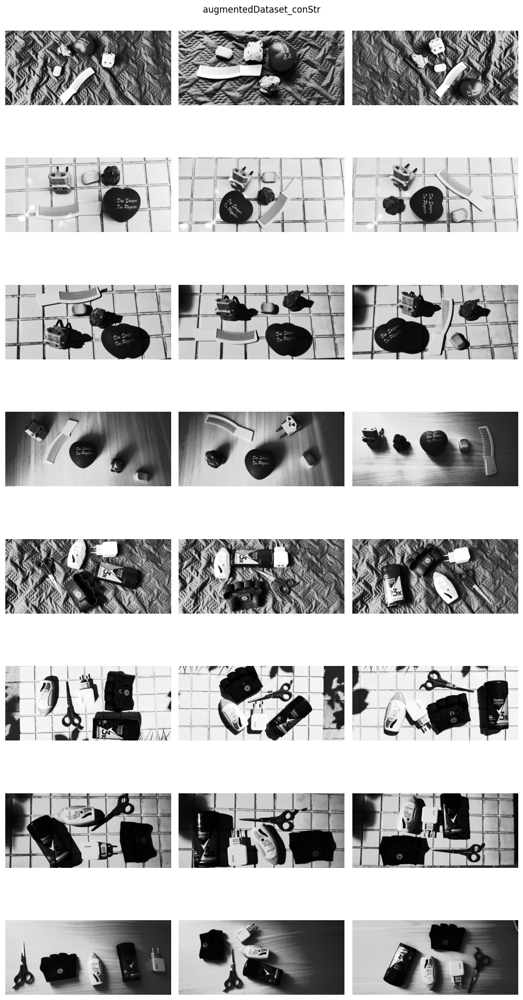

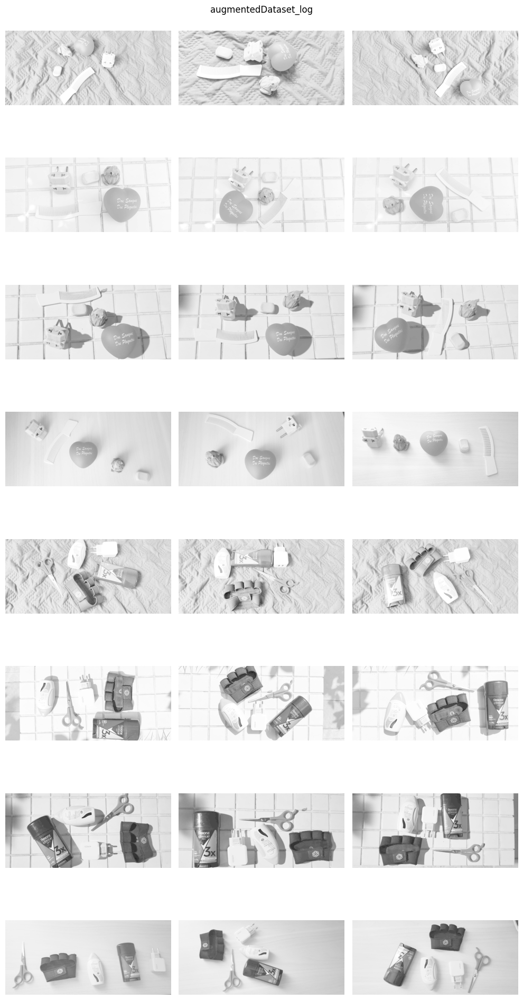

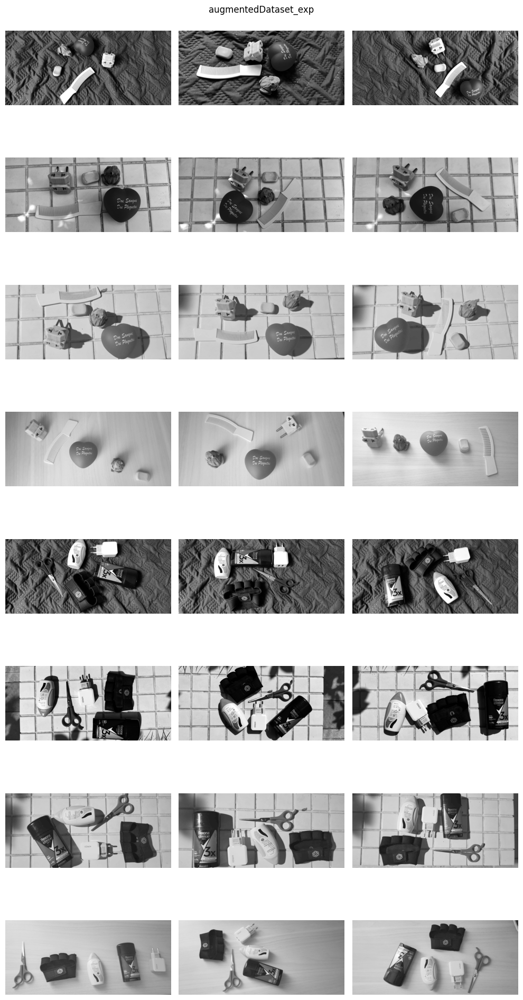

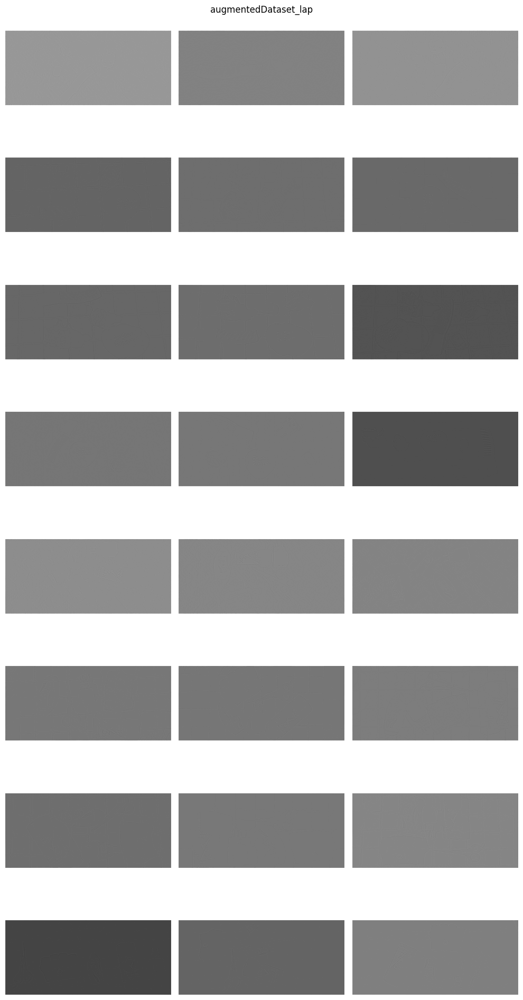

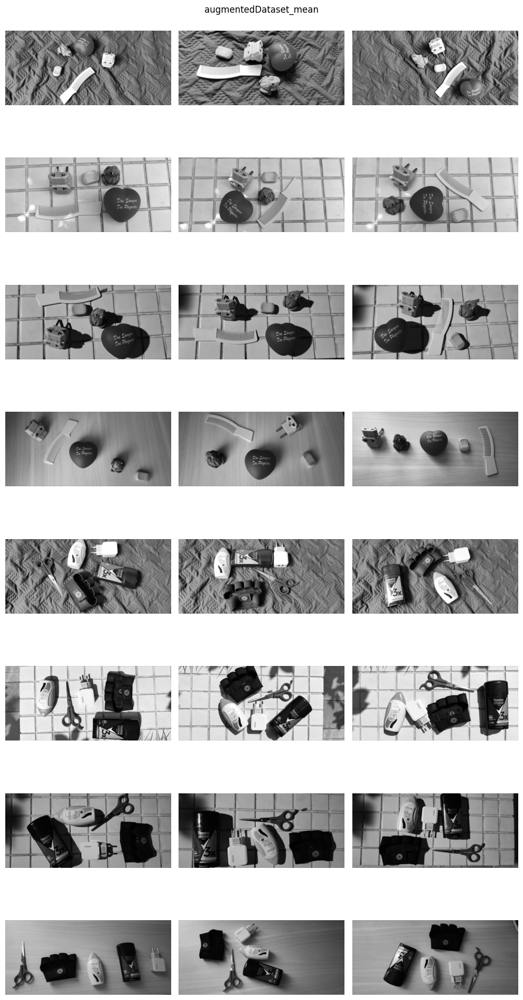

In [1]:
# @title
### EP2 MAC0417 / MAC5768
##################################################################
# AO PREENCHER ESSE CABEÇALHO COM O MEU NOME E O MEU NÚMERO USP,#
# DECLARO QUE SOU O ÚNICO AUTOR E RESPONSÁVEL PELA RESOLUÇÃO #
# DESTE EP. #
# TODAS AS PARTES FORAM DESENVOLVIDAS E IMPLEMENTADAS POR MIM, #
# SEGUINDO AS INSTRUÇÕES E QUE PORTANTO, NÃO CONSTITUEM #
# DESONESTIDADE ACADÊMICA OU PLÁGIO. #
# #
# DECLARO TAMBÉM, QUE SOU RESPONSÁVEL POR TODAS AS CÓPIAS #
# DESSE PROGRAMA, E QUE EU NÃO DISTRIBUI OU FACILITEI A #
# SUA DISTRIBUIÇÃO. ESTOU CIENTE QUE OS CASOS DE PLÁGIO E #
# DESONESTIDADE ACADÊMICA SERÃO TRATADOS SEGUNDO OS CRITÉRIOS #
# DEFINIDOS NO CÓDIGO DE ÉTICA DA USP. #
# #
# ENTENDO QUE JUPYTER NOTEBOOKS SEM ASSINATURA NÃO SERÃO #
# CORRIGIDOS E, AINDA ASSIM, PODERÃO SER PUNIDOS POR #
# DESONESTIDADE ACADÊMICA. #
# #
# #
# Nome : Fábio Baptista Cardoso #
# NUSP : 12557313 #
# Turma: 2024145 #
# Prof.: Ronaldo Fumio Hashimoto  #
##################################################################

# PARTE 1 #

import numpy as np
import matplotlib.pyplot as plt
from matplotlib.pyplot import imread
import os
import pandas as pd
from cv2 import imwrite

def plot_img(fig, titulo):
  plt.figure(figsize=(10,10))
  plt.imshow(fig, cmap='gray', vmin=0, vmax=255)
  plt.title(titulo)
  plt.axis('off')
  plt.show()

def plot8x3(images, title=''):
    fig, axs = plt.subplots(8, 3, figsize=(10, 20))
    for i, ax in enumerate(axs.flat):
        ax.imshow(images[i], cmap='gray')
        ax.axis('off')
    plt.tight_layout()
    plt.suptitle(title)
    plt.show()

# Tabela sumária dos dados

dir_path = './imgs'
files = os.listdir(dir_path)
classes = set()

for file in files:
    iStart = file.index('Classes(')
    iEnd = file.index(')')
    classes = classes.union(set(file[iStart + 8:iEnd].split(','))) # Pegando todas as classes presentes nas imagens

dados = {
    "Colunas": ["Nome das classes", "Número de classes", "Número de imagens", "Tamanho da base (bytes)", "Resolução das imagens"],
    "Valores": [', '.join(classes), len(classes), len(files), os.path.getsize(dir_path), imread(dir_path + '/' + files[0]).shape[0:2]]
}
df = pd.DataFrame(dados)
print(df.to_string()) # Plotando a tabela

# Funções de transformação de imagens

def RGB2gray(imgs):
    originalGrayDataset = []
    rgb_gray = [0.2989, 0.5870, 0.1140]
    for img in imgs:
        originalGrayDataset += [np.dot(imread(dir_path + '/' + img).astype(float), rgb_gray)] # Transformando em imagens em escala de cinza
    
    save_dir = './originalGrayDataset'
    os.makedirs(save_dir, exist_ok=True)
    for i, img in enumerate(originalGrayDataset):
        file_name = f'gray_{files[i]}'
        file_path = os.path.join(save_dir, file_name)
        imwrite(file_path, img)
    return originalGrayDataset
    
def saveImage(img, transform='', save_dir='./augmentedDataset'):
    save_dirT = f'{save_dir}/{transform}'
    os.makedirs(save_dirT, exist_ok=True)
    file_name = f'{transform}_{grayFiles[i]}'
    file_path = os.path.join(save_dirT, file_name)
    imwrite(file_path, img)

def contrastStretching(img):
    # desenhei no geogebra uma função que partia de (0,0) e ia até (100,50), depois de (100,150) até (150,200) e de (150,200) até (255,255)
    # sendo que na primeira parte a função é f(x) = x/2 (escurece essa faixa de pixels), na segunda f(x) = 3x - 250 (escurece e ilumina a faixa de pixels)
    # e na terceira f(x) = 55x/105 + 200 - 55*150/105 (ilumina a faixa de pixels). No final, pixels menores que 125 ficam mais escuros e pixels maiores que 125 ficam mais claros.
    imgNova = np.zeros(img.shape)
    for i in range(img.shape[0]):
        for j in range(img.shape[1]):
            if 0 <= img[i][j] < 100:
                imgNova[i][j] = img[i][j] / 2
            elif 100 <= img[i][j] < 150:
                imgNova[i][j] = img[i][j] * 3 - 250
            else:
                imgNova[i][j] = img[i][j] * 55 / 105 + 200 - 55 * 150 / 105
    saveImage(imgNova, 'conStr')
    return imgNova

def constantsForIluminacao(file): # DETERMINAR C E GAMMA
    '''
    Recebe o nome do arquivo e retorna os valores de c e gamma baseado na iluminação e no ambiente
    presentes no próprio nome do arquivo
    '''
    iStart = file.index('Iluminacao(') + 11
    iEnd = file[iStart : ].index(')') + iStart
    ilum, amb = file[iStart : iEnd].split('X')
    c = {'Dentrodecasa': 1, 'Foradecasa': 1.5}[ilum]
    gamma = {'Dia': 1.5, 'Noite': 0.5}[amb]
    return c, gamma

def log(img, c=1):
    imgNova = np.zeros(img.shape)
    imgNova = c * np.log(1 + img)
    imgNova = imgNova - imgNova.min()
    imgNova = imgNova * 255 / imgNova.max()
    saveImage(imgNova, 'log')
    return imgNova

def exponencial(img, c=1, gamma=1):
    imgNova = np.zeros(img.shape)
    imgNova = c * np.power(img, gamma)
    imgNova = imgNova - imgNova.min()
    imgNova = imgNova * 255 / imgNova.max()
    saveImage(imgNova, 'exp')
    return imgNova

def laplacian(img):
    imgNova = np.zeros(img.shape)
    laplacian = np.array([[0, -1, 0], [-1, 4, -1], [0, -1, 0]])
    imgNova = np.pad(img, 1, mode='constant')
    imgNova = np.array([[np.sum(imgNova[i:i+3, j:j+3] * laplacian) for j in range(imgNova.shape[1] - 2)] for i in range(imgNova.shape[0] - 2)])
    imgNova = imgNova - imgNova.min()
    imgNova = imgNova * 255 / imgNova.max()
    saveImage(imgNova, 'lap')
    return imgNova

def mean(img):
    imgNova = np.zeros(img.shape)
    mean = np.array([[1,1,1],[1,1,1],[1,1,1]]) / 9 # filtro simétrico, correlação == convolução
    imgNova = np.pad(img, 1, mode='constant')
    imgNova = np.array([[np.sum(imgNova[i:i+3, j:j+3] * mean) for j in range(imgNova.shape[1] - 2)] for i in range(imgNova.shape[0] - 2)])
    imgNova = imgNova - imgNova.min()
    imgNova = imgNova * 255 / imgNova.max()
    saveImage(imgNova, 'mean')
    return imgNova

# originalGrayDataset = RGB2gray(files) # salva as imagens em escala de cinza em /originalGrayDataset
dir_path = './originalGrayDataset'
grayFiles = os.listdir(dir_path)
originalGrayDataset = [imread(f'{dir_path}/{grayImg}').astype(float) for grayImg in grayFiles]
plot8x3(originalGrayDataset, 'originalGrayDataset')

# augmentedDataset = []
# save_dir = './augmentedDataset'
# os.makedirs(save_dir, exist_ok=True)
# for i, img in enumerate(originalGrayDataset):
    # augmentedDataset += [contrastStretching(img)]
    # c, gamma = constantsForIluminacao(grayFiles[i])
    # augmentedDataset += [log(img, c)]
    # augmentedDataset += [exponencial(img, c, gamma)]
    # augmentedDataset += [laplacian(img)]
    # augmentedDataset += [mean(img)]
# Esse código salvou as imagens em /augmentedDataset/conStr, /augmentedDataset/log, /augmentedDataset/exp, /augmentedDataset/lap e /augmentedDataset/mean

dir_path = './augmentedDataset'
transformList = ['conStr', 'log', 'exp', 'lap', 'mean']
for transform in transformList:
    augmentedDataset = [imread(f'{dir_path}/{transform}/{augmentedImg}').astype(float) for augmentedImg in os.listdir(dir_path + '/' + transform)]
    plot8x3(augmentedDataset, f'augmentedDataset_{transform}')
    

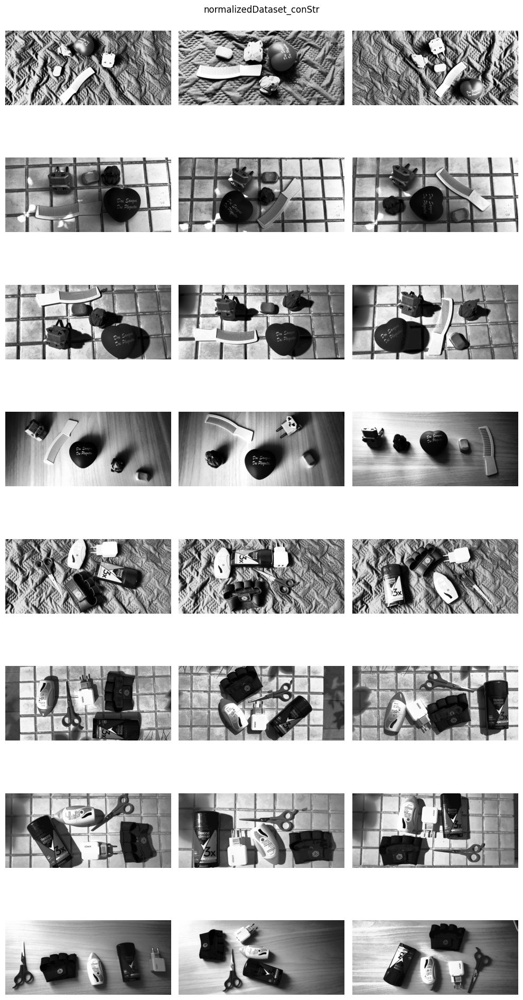

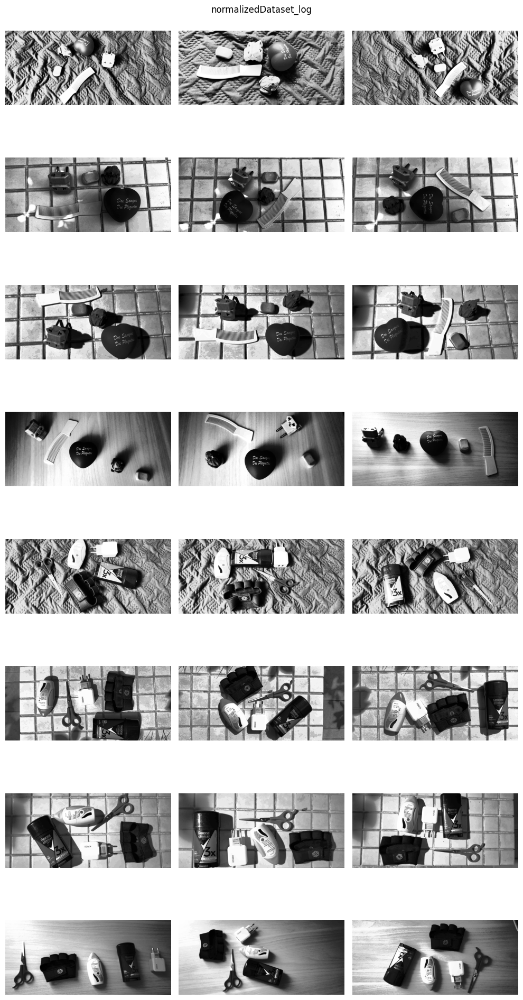

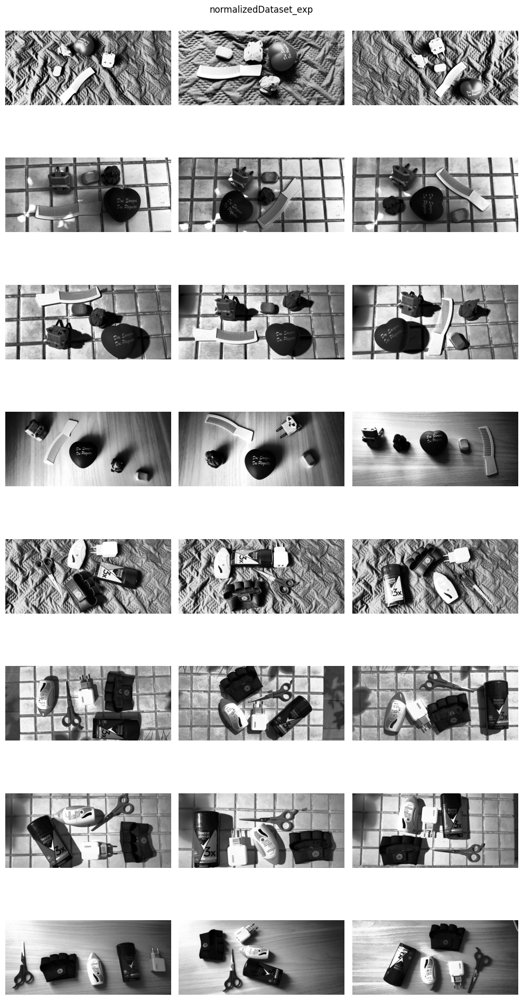

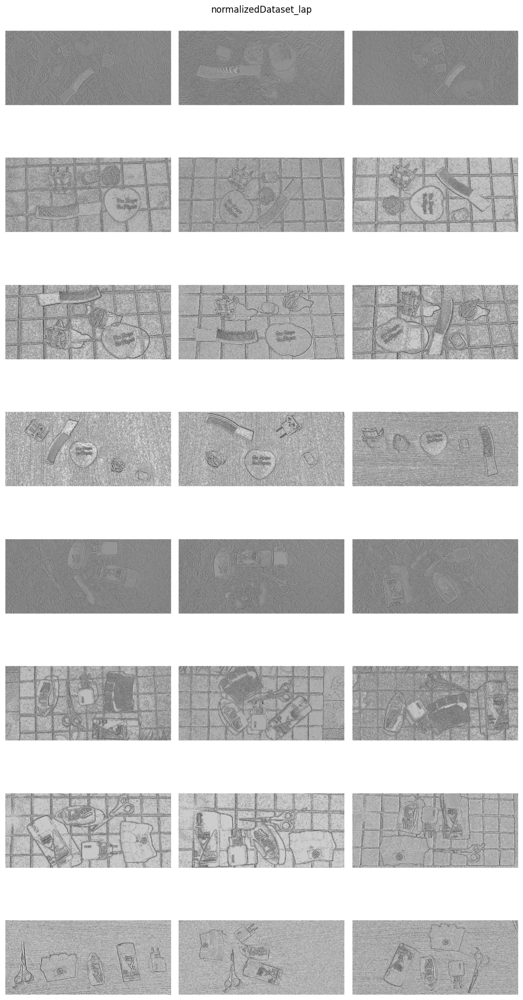

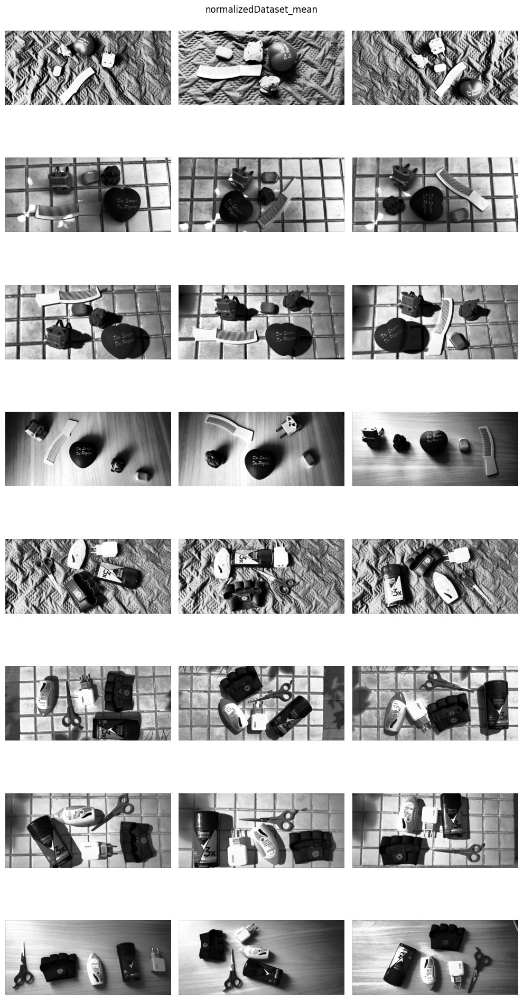

...

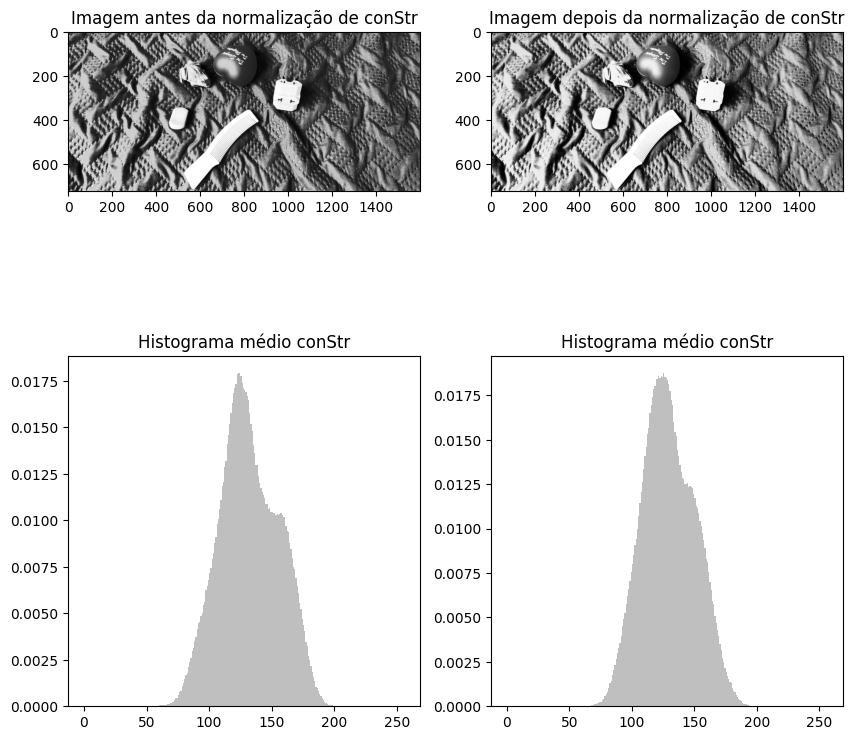

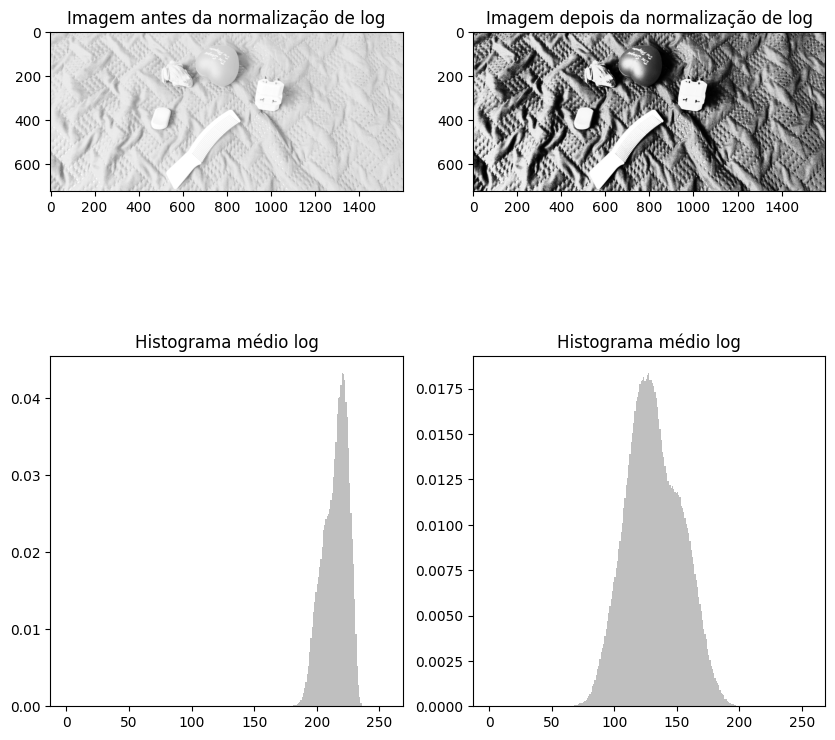

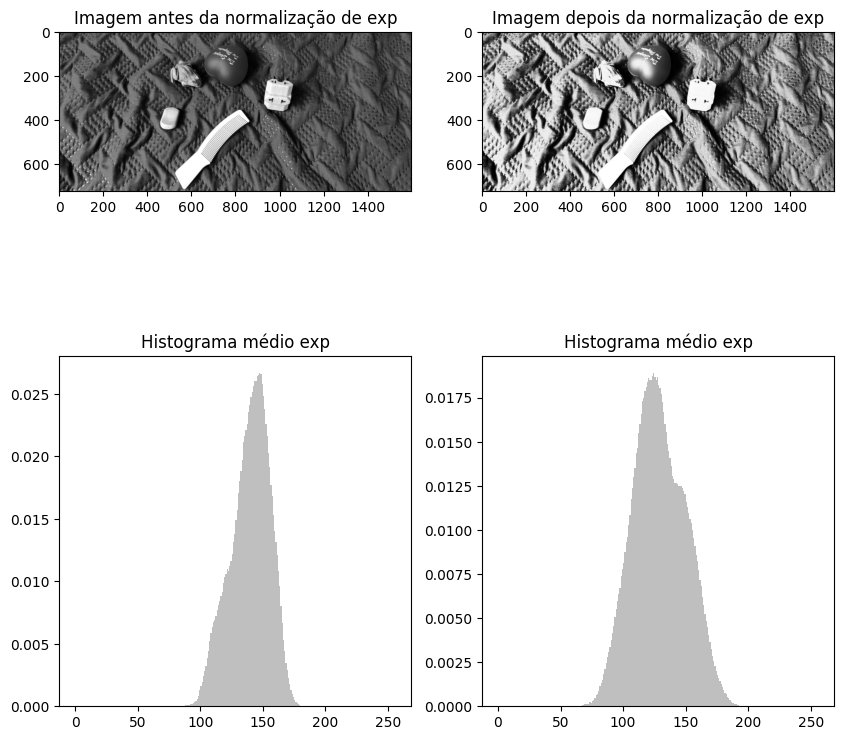

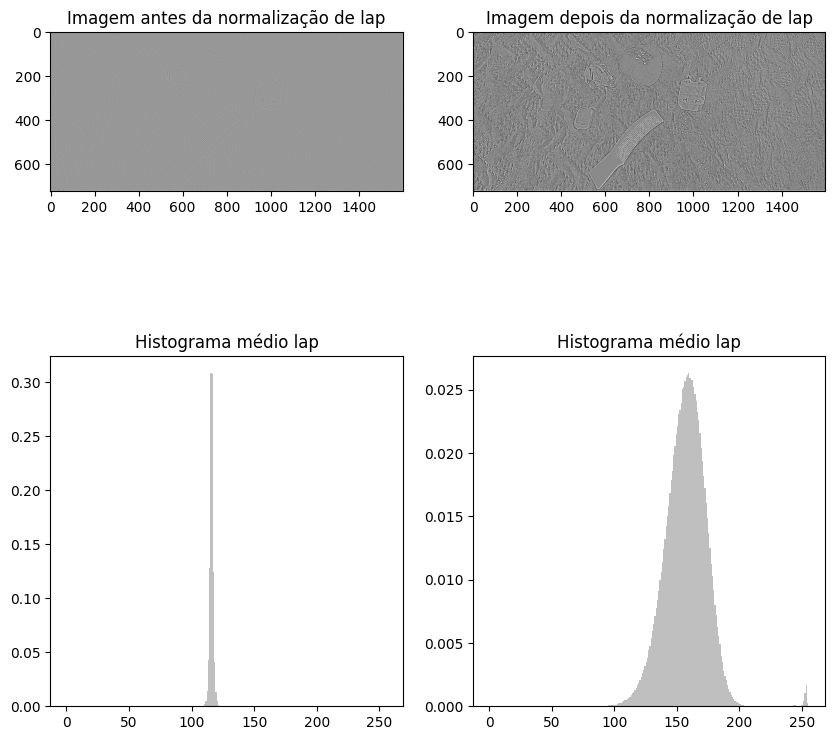

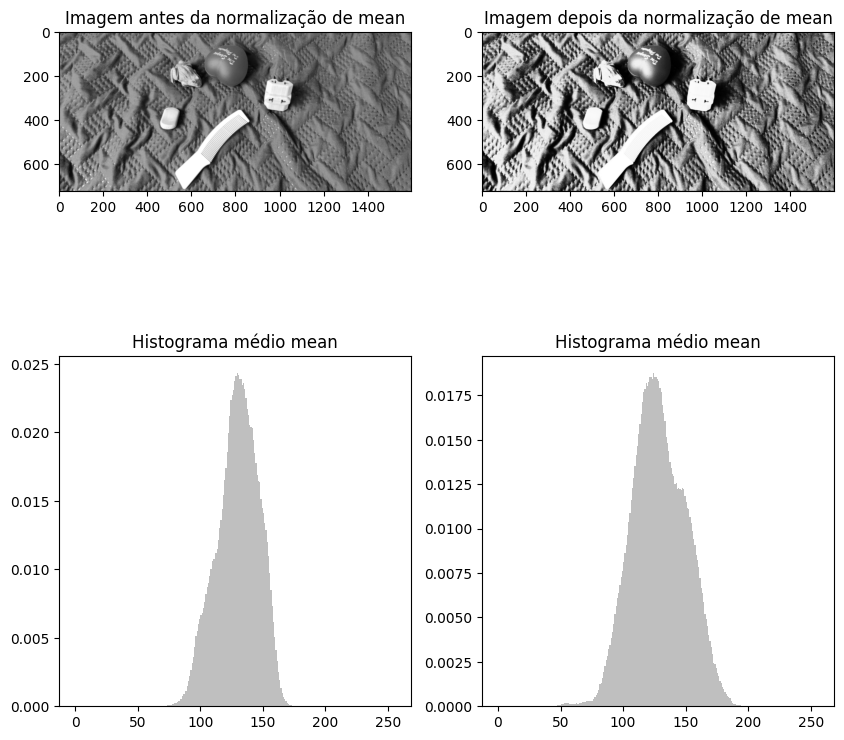

In [3]:
# @title
### EP2 MAC0417 / MAC5768
##################################################################
# AO PREENCHER ESSE CABEÇALHO COM O MEU NOME E O MEU NÚMERO USP,#
# DECLARO QUE SOU O ÚNICO AUTOR E RESPONSÁVEL PELA RESOLUÇÃO #
# DESTE EP. #
# TODAS AS PARTES FORAM DESENVOLVIDAS E IMPLEMENTADAS POR MIM, #
# SEGUINDO AS INSTRUÇÕES E QUE PORTANTO, NÃO CONSTITUEM #
# DESONESTIDADE ACADÊMICA OU PLÁGIO. #
# #
# DECLARO TAMBÉM, QUE SOU RESPONSÁVEL POR TODAS AS CÓPIAS #
# DESSE PROGRAMA, E QUE EU NÃO DISTRIBUI OU FACILITEI A #
# SUA DISTRIBUIÇÃO. ESTOU CIENTE QUE OS CASOS DE PLÁGIO E #
# DESONESTIDADE ACADÊMICA SERÃO TRATADOS SEGUNDO OS CRITÉRIOS #
# DEFINIDOS NO CÓDIGO DE ÉTICA DA USP. #
# #
# ENTENDO QUE JUPYTER NOTEBOOKS SEM ASSINATURA NÃO SERÃO #
# CORRIGIDOS E, AINDA ASSIM, PODERÃO SER PUNIDOS POR #
# DESONESTIDADE ACADÊMICA. #
# #
# #
# Nome : Fábio Baptista Cardoso #
# NUSP : 12557313 #
# Turma: 2024145 #
# Prof.: Ronaldo Fumio Hashimoto  #
##################################################################

# PARTE 2 #

import numpy as np
import matplotlib.pyplot as plt
from matplotlib.pyplot import imread
import os
import pandas as pd
from cv2 import imwrite

def plot_img(fig, titulo):
  plt.figure(figsize=(10,10))
  plt.imshow(fig, cmap='gray', vmin=0, vmax=255)
  plt.title(titulo)
  plt.axis('off')
  plt.show()
  
def plot8x3(images, title=''):
    fig, axs = plt.subplots(8, 3, figsize=(10, 20))
    for i, ax in enumerate(axs.flat):
        ax.imshow(images[i], cmap='gray')
        ax.axis('off')
    plt.tight_layout()
    plt.suptitle(title)
    plt.show()

# Imagens normalizadas

def normalize(img, save_dir='./normalizedDataset'):
    # Retirei essa função da minha própria implementação da lista 1 (não foi corrigida até o momento mas acredito estar certa)
    imgNova = np.zeros(img.shape)
    hist = np.zeros(256)
    for i in range(img.shape[0]):
        for j in range(img.shape[1]):
            hist[round(img[i][j])] += 1
    hist = hist / (img.shape[0] * img.shape[1])
    hist = np.cumsum(hist)
    for i in range(img.shape[0]):
        for j in range(img.shape[1]):
            imgNova[i][j] = 255 * hist[round(img[i][j])]
    file_name = f'normalized_{augmentedFiles[k]}'
    file_path = os.path.join(f'{save_dir}/{transform}', file_name)
    imwrite(file_path, imgNova)

dir_path = './originalGrayDataset'
grayFiles = os.listdir(dir_path)
originalGrayDataset = [imread(f'{dir_path}/{grayImg}').astype(float) for grayImg in grayFiles]

transformList = ['conStr', 'log', 'exp', 'lap', 'mean']

# dir_path = './augmentedDataset'
# save_dir = './normalizedDataset'
# for transform in transformList:
#     augmentedFiles = os.listdir(dir_path + '/' + transform)
#     augmentedDataset = [imread(f'{dir_path}/{transform}/{augmentedImg}').astype(float) for augmentedImg in augmentedFiles]
#     os.makedirs(f'{save_dir}/{transform}', exist_ok=True)
#     for k, img in enumerate(augmentedDataset):
#         normalize(img)
# executei esse código para salvar as imagens normalizadas em /normalizedDataset

for transform in transformList:
    dir_path = './normalizedDataset' + '/' + transform
    normalizedFiles = os.listdir(dir_path)
    normalizedDataset = [imread(f'{dir_path}/{normalizedImg}').astype(float) for normalizedImg in normalizedFiles]
    plot8x3(normalizedDataset, f'normalizedDataset_{transform}')
    
# Histogramas médios

def meanHist(imgs, title=''):
    mean = sum(imgs) / len(imgs)
    plt.hist(mean.ravel(), bins=256, range=(0, 256), density=True, color='gray', alpha=0.5)
    plt.title('Histograma médio ' + title)
    plt.show()
    
def meanHistGrid2x2(dataSet1, dataSet2, transform):
    mean1 = sum(dataSet1) / len(dataSet1)
    mean2 = sum(dataSet2) / len(dataSet2)
    fig, axs = plt.subplots(2, 2, figsize=(10, 10))
    axs[0, 0].imshow(dataSet1[0], cmap='gray')
    axs[0, 0].set_title('Imagem antes da normalização de ' + transform)
    axs[0, 1].imshow(dataSet2[0], cmap='gray')
    axs[0, 1].set_title('Imagem depois da normalização de ' + transform)
    axs[1, 0].hist(mean1.ravel(), bins=256, range=(0, 256), density=True, color='gray', alpha=0.5)
    axs[1, 0].set_title('Histograma médio ' + transform)
    axs[1, 1].hist(mean2.ravel(), bins=256, range=(0, 256), density=True, color='gray', alpha=0.5)
    axs[1, 1].set_title('Histograma médio ' + transform)
    plt.show()

dentroXdia = []
dentroXnoite = []
foraXdia = []
foraXnoite = []
for k, file in enumerate(grayFiles):
    if 'DentrodecasaXDia' in file:
        dentroXdia += [originalGrayDataset[k]]
    elif 'DentrodecasaXNoite' in file:
        dentroXnoite += [originalGrayDataset[k]]
    elif 'ForadecasaXDia' in file:
        foraXdia += [originalGrayDataset[k]]
    else:
        foraXnoite += [originalGrayDataset[k]]
   
meanHist(dentroXdia, 'DentrodecasaXDia')
meanHist(dentroXnoite, 'DentrodecasaXNoite')
meanHist(foraXdia, 'ForadecasaXDia')
meanHist(foraXnoite, 'ForadecasaXNoite')

for transform in transformList:
    dir_path = './augmentedDataset' + '/' + transform
    augmentedFiles = os.listdir(dir_path)
    augmentedDataset = [imread(f'{dir_path}/{augmentedImg}').astype(float) for augmentedImg in augmentedFiles]
    # meanHist(augmentedDataset, transform)
    
    dir_path = './normalizedDataset' + '/' + transform
    normalizedFiles = os.listdir(dir_path)
    normalizedDataset = [imread(f'{dir_path}/{normalizedImg}').astype(float) for normalizedImg in normalizedFiles]
    # meanHist(normalizedDataset, f'normalizado_{transform}')
    meanHistGrid2x2(augmentedDataset, normalizedDataset, transform)


# Discussão

A normalização dos datasets funcionou muito bem, mesmo com variações de iluminação, melhorando a nitidez e a qualidade geral das imagens. No entanto, o resultado da normalização pode variar dependendo das iluminações, no geral os resultados foram satisfatório mas alguns mais do que outros. A escuridão de fotos tiradas de noite com auxílio de luzes artificiais impacta nos níveis de cinza predominantes na imagem, na perda de detalhes e no aumento de ruído, visto que a noite é possível ver menos detalhes do que quando temos uma luz do sol espalhada mais uniformemente. Como os valores escolhidos para os hiperparâmetros foram arbitrariamente escolhidos por mim depois de alguns testes, pode ser que não obtemos o desempenho máximo que poderíamos, talvez com mais estudo sobre um "hiperparâmetro ótimo" para cada tipo de iluminação meus resultados tivessem melhorado. Em suma, tivemos resultados ótimos mas ainda com espaço para uma melhora em detalhes para cada iluminação